In [1]:
import pandas as pd

In [2]:
Treepredictions = pd.ExcelWriter('Tree predictions.xlsx', engine='xlsxwriter') #pip install xlsxwriter
'Segment 1'
print ("Segment 1")
TrainPd=pd.read_excel('1st Segment.xlsx')      #conda  install xlrd
Ytrain=TrainPd[['Travel_Time']];
Xtrain=TrainPd.drop(['Travel_Time'],axis=1)
Names=list(Xtrain.columns.values) #Names of pandas

from sklearn.tree import DecisionTreeRegressor
Tree_model = DecisionTreeRegressor(random_state = 0, max_depth=8)
Tree_model.fit(Xtrain, Ytrain)

Segment 1
[ 0.26550781  0.83514183 88.91407437  1.17714868  0.78786099  3.83628017
  0.69219363  0.11161666  0.29783038  0.92638581  0.96234357  0.29546015
  0.25666581  0.24704541  0.29032116  0.10412359]


In [ ]:
#predict using the tree
Prediction=Tree_model.predict([1,72,38.2,38.0, 37.7, 0.26, 0.268, 0.011, 13.3, -0.05, 0.012,
                               15.55, -0.052, 0.013, 17.78, -0.048]) #This is numpy prediction array
print (Prediction)

In [ ]:
#Feature importance
importances=Tree_model.feature_importances_
print (importances*100)

In [ ]:
for f in range(Xtrain.shape[1]):
    print((Names[f],  importances[[f]]))

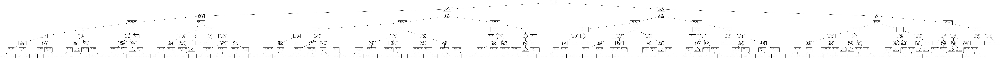

In [3]:
from sklearn.tree import export_graphviz  #conda install graphviz #conda install python-graphviz
#https://graphviz.gitlab.io/_pages/Download/Download_windows.html
#C:\Program Files (x86)\Graphviz2.38\bin
from sklearn import tree
#Will need to add graphviz to enviroment variables
#where python  to check
#C:\Users\602202\AppData\Local\Continuum\anaconda3\Library\bin\graphviz
import pydotplus #conda install pydotplus
from IPython.display import Image  

# Create DOT data
dot_data = tree.export_graphviz(Tree_model, out_file=None, 
                                feature_names=Names)  
                                #class_names=iris.target_names)
# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)  

# Show graph
Image(graph.create_png())

In [5]:
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 10})
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,4), dpi=4000)
tree.plot_tree(Tree_model,
               feature_names = Names, 
              # class_names=cn,
               filled = True);fig.savefig('imagename.png')

fig.savefig('imagename.png')